# Reconstrucción de seno y coseno iniciales con gaussianas para aproximar solución de ecuación de onda

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize

from fbpinns.analysis import load_model

import fbpinn_wave as fw
from fbpinn_wave import ExactAny, Wave1DMultiPulse

#------------------------------Definiciones del problema----------------------
def rect(min, max, x):
  r = np.ones_like(x)
  r[x < min] = 0
  r[x > max] = 0
  return r

def f(x):
  return (np.cos(2*np.pi*1/40*x) + 2)*rect(-40, 40, x)

def g(x):
   return (np.sin(2*np.pi*1/40*x))*rect(-40, 40, x)


def gaussian_mixture(x, weights, means):
    """ Calcula la mezcla de gaussianas para un conjunto de parámetros """
    mixture = np.zeros_like(x)
    std_devs = 4 # La fijo en un valor. Se podría también aprender pero no creo que sea lo mejor
    for i in range(len(weights)):
        mixture += weights[i] * norm.pdf(x, means[i], std_devs)
    return mixture

#------------------------------------------------------------------------------
# Paso 4: Función de error (mínimos cuadrados)
def error(params, x, y_true):
    k = len(params)//2 # Número de componentes gaussianas, la mitad son los pesos la mitad son las medias
    weights = params[:k]
    means = params[k:]

    y_pred = gaussian_mixture(x, weights, means)

    # Error cuadrático
    return np.sum((y_pred - y_true)**2)

def gaussian_aproximation(x_vals, y_vals, k, min, max):
  weights_init = np.ones(k) / k  # Pesos iniciales uniformes
  means_init = np.linspace(min, max, k)  # Centros distribuidos uniformemente (ej. en [0, 2*pi])
  # Concatenar los parámetros iniciales
  params_init = np.r_[weights_init, means_init]

  # Paso 6: Optimización de los parámetros
  result = minimize(error, params_init, args=(x_vals, y_vals), method='L-BFGS-B')

  optimized_params = result.x
  optimized_weights = optimized_params[:k]
  optimized_means = optimized_params[k:]
  return gaussian_mixture(x_vals, optimized_weights, optimized_means), optimized_weights, optimized_means


In [ ]:
p0_cos = ExactAny("exact/exact_any_cos.mat")
p0_sin = ExactAny("exact/exact_any_sin.mat")
#p0_sin.animation()

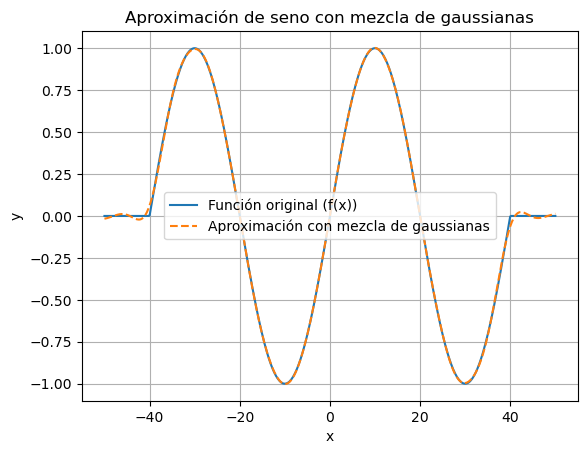

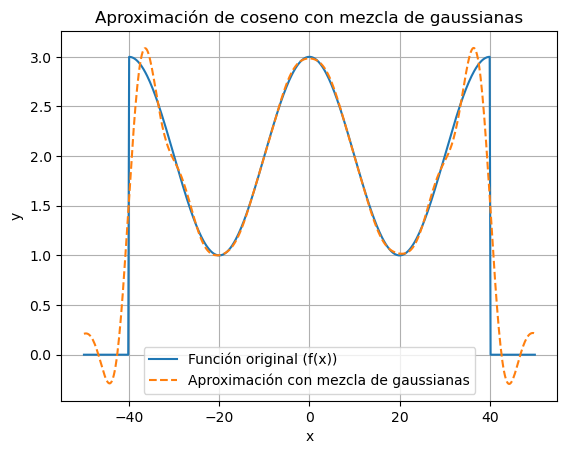

In [5]:
lim_inf = -50
lim_sup = 50
x_vals = np.linspace(lim_inf, lim_sup, 500)
y_vals = g(x_vals)
k = 50

y_approx_s, w_s, mu_s = gaussian_aproximation(x_vals, y_vals, k, lim_inf, lim_sup)

plt.plot(x_vals, y_vals, label="Función original (f(x))")
plt.plot(x_vals, y_approx_s, label="Aproximación con mezcla de gaussianas", linestyle='dashed')
plt.legend()
plt.grid()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Aproximación de seno con mezcla de gaussianas')
plt.show()

y_vals = f(x_vals)
y_approx_c, w_c, mu_c = gaussian_aproximation(x_vals, y_vals, k, lim_inf, lim_sup)

plt.plot(x_vals, y_vals, label="Función original (f(x))")
plt.plot(x_vals, y_approx_c, label="Aproximación con mezcla de gaussianas", linestyle='dashed')
plt.legend()
plt.grid()
plt.xlabel('x')
plt.ylabel('y')
plt.title('Aproximación de coseno con mezcla de gaussianas')
plt.show()

In [6]:
Wave1DMultiPulse()

x = np.linspace(-50, 50, p0_sin.Nx)
t = np.linspace(0, 50, p0_sin.Nt-1)

const, model = load_model(run="test", i=80000, rootdir="multi_pulse1/results/")

u_c = np.zeros_like(p0_cos.u).T
u_s = np.zeros_like(p0_sin.u).T

for i in range(0, len(w_s)):
    u_c += w_c[i]*fw.generate_new(model, const, x, t, mu_c[i])/np.sqrt(2*np.pi*16)
    u_s += w_s[i]*fw.generate_new(model, const, x, t, mu_s[i])/np.sqrt(2*np.pi*16)


[INFO] 2025-05-26 17:30:05 - Loading model from:
multi_pulse1/results/models/test/model_00080000.jax
[INFO] 2025-05-26 17:30:06 - x_batch
[INFO] 2025-05-26 17:30:06 - (45150, 3), float64, ndarray
[INFO] 2025-05-26 17:30:06 - x_take
[INFO] 2025-05-26 17:30:06 - (643200, 3), float64, ndarray
[INFO] 2025-05-26 17:30:07 - x_batch
[INFO] 2025-05-26 17:30:07 - (45150, 3), float64, ndarray
[INFO] 2025-05-26 17:30:07 - x_take
[INFO] 2025-05-26 17:30:07 - (643200, 3), float64, ndarray
[INFO] 2025-05-26 17:30:08 - x_batch
[INFO] 2025-05-26 17:30:08 - (45150, 3), float64, ndarray
[INFO] 2025-05-26 17:30:08 - x_take
[INFO] 2025-05-26 17:30:08 - (643200, 3), float64, ndarray
[INFO] 2025-05-26 17:30:08 - x_batch
[INFO] 2025-05-26 17:30:08 - (45150, 3), float64, ndarray
[INFO] 2025-05-26 17:30:08 - x_take
[INFO] 2025-05-26 17:30:08 - (643200, 3), float64, ndarray
[INFO] 2025-05-26 17:30:09 - x_batch
[INFO] 2025-05-26 17:30:09 - (45150, 3), float64, ndarray
[INFO] 2025-05-26 17:30:09 - x_take
[INFO] 2

In [8]:
ecm = np.mean((p0_cos.u - u_c.T)**2)
ecm = np.format_float_scientific(ecm, precision=3)
print("ECM = " + str(ecm))
p0_cos.animation(compare=True, u_compare=u_c.T)
ecm = np.mean((p0_sin.u - u_s.T)**2)
ecm = np.format_float_scientific(ecm, precision=3)
print("ECM = " + str(ecm))
p0_sin.animation(compare=True, u_compare=u_s.T)

ECM = 2.266e-02


ECM = 4.809e-04
